Preview :

In [3]:
import tensorflow as tf
import numpy as np

In [2]:
tf.test.is_built_with_cuda()


True

Load Data :

In [3]:
# !pip install tensorflow-datasets
import tensorflow as tf
import tensorflow_datasets as tfds

data = tfds.load("deep_weeds", with_info = True)

Split Data :

In [4]:
data_train, data = tfds.load("deep_weeds", with_info=True, split='train[0%:60%]')
data_valid , val_inf  = tfds.load("deep_weeds", with_info=True, split='train[60%:80%]')
data_test , test_inf   = tfds.load("deep_weeds", with_info=True, split='train[80%:100%]')

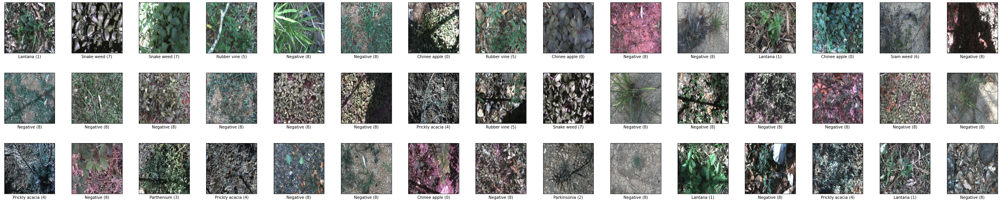

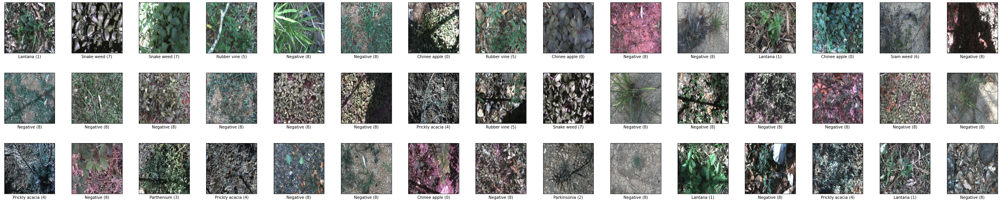

In [5]:
tfds.show_examples(data_train, data, rows=3, cols=15)

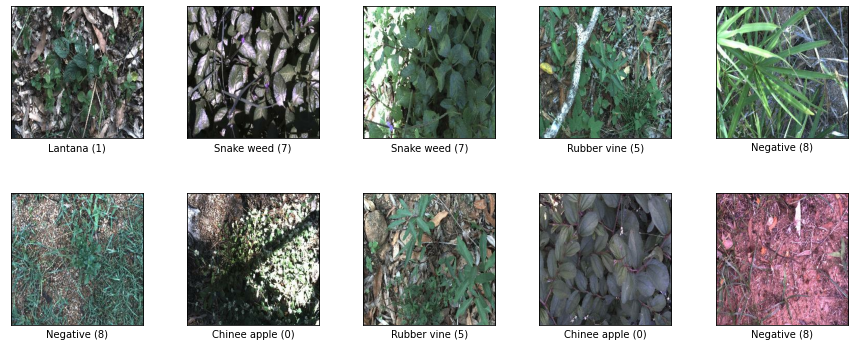

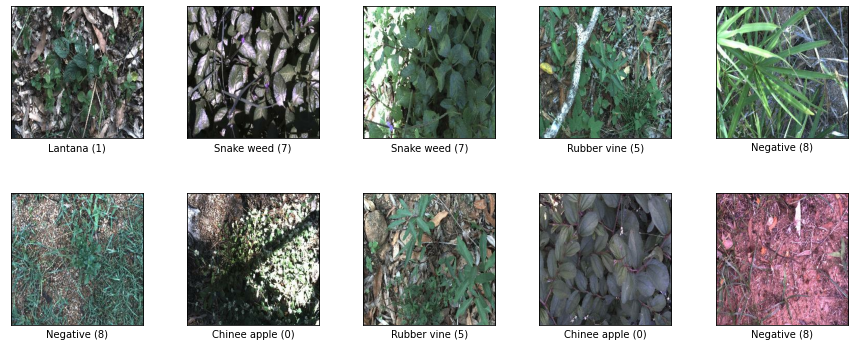

In [6]:
tfds.show_examples(data_train, data, rows=2, cols=5)

Data Preprocessing :

In [7]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


Num GPUs Available:  1


In [8]:
ds = list(data_train.take(5))

In [11]:
ds[0]['image'].shape

TensorShape([256, 256, 3])

In [12]:
import math
# pip install tensorflow-addons
import tensorflow_addons as tfa

batch_size = 8
def preprocess_weeds(dic):
  image = dic['image']
  # Scale to between 0 and 1
  preprocessed_image = tf.image.resize(image,[224,224])/255 
  label = dic['label']
  return preprocessed_image, label

def augment(image,label):
  # Random brightness
  image = tf.image.random_brightness(image, max_delta=0.5) 
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_flip_up_down(image)
  image = tf.image.random_hue(image, max_delta=0.1)
  # Adjust contrast
  image = tf.image.random_contrast(image, lower=0.7, upper=1.3) 
  delta = tf.random.uniform([], math.radians(-360),math.radians(360))
  image = tfa.image.rotate(image, delta)
  return image, label

# Use the batch method to prepare batches.
data_train_gen = (data_train
                  .map(preprocess_weeds)
                  .map(augment,
                     num_parallel_calls = tf.data.experimental.AUTOTUNE)
                  .batch(batch_size)
                  .prefetch(tf.data.experimental.AUTOTUNE))
data_valid_gen = (data_valid
                  .map(preprocess_weeds)
                  .batch(batch_size)
                  .prefetch(tf.data.experimental.AUTOTUNE))
data_test_gen = data_test.map(preprocess_weeds).batch(batch_size)

Building Model :

In [13]:
from tensorflow.keras.layers import Input, Dense, Flatten, AveragePooling2D
image_input = Input((224,224,3))
resnet = tf.keras.applications.ResNet50(include_top=False, weights="imagenet")
NUM_CLASSES=9
model = tf.keras.Sequential(
    [image_input,
     resnet,
     AveragePooling2D(),
     tf.keras.layers.Flatten(),
     Dense(NUM_CLASSES, activation="softmax")])
model.compile(optimizer="adam",loss="sparse_categorical_crossentropy",metrics="accuracy")

In [14]:
tf.test.is_built_with_cuda()

True

In [16]:
tf.test.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)

True

In [17]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

Training Model

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
average_pooling2d (AveragePo (None, 3, 3, 2048)        0         
_________________________________________________________________
flatten (Flatten)            (None, 18432)             0         
_________________________________________________________________
dense (Dense)                (None, 9)                 165897    
Total params: 23,753,609
Trainable params: 23,700,489
Non-trainable params: 53,120
_________________________________________________________________


In [20]:
model.fit(data_train_gen,
          batch_size=batch_size,
          epochs=50,
          validation_data=data_valid_gen
          #history callbacl plot keras
          )


SyntaxError: unexpected EOF while parsing (<ipython-input-20-e876ce012973>, line 5)

Evaluating Model

In [ ]:
print(model.evaluate(data_test_gen))
model.save("deep_weeds_resnet.h5")    

In [19]:
from tensorflow import keras
#model = keras.models.load_model('deep_weeds_resnet.  h5')
reconstructed_model = keras.models.load_model("deep_weeds_resnet.h5")


In [20]:
loss, accuracy = reconstructed_model.evaluate(data_test_gen)
print(f"Loss: {loss}")
print(f"Test accuracy: {round(accuracy * 100, 2)}%")

438/438 [==============================] - 61s 132ms/step - loss: 0.6967 - accuracy: 0.7890
Loss: 0.6966932415962219
Test accuracy: 78.9%


In [21]:
'''with tf.Session() as sess:
  new_saver = tf.train.import_meta_graph('my_test_model-1000.meta')
  new_saver.restore(sess, tf.train.latest_checkpoint('./'))
with tf.Session() as sess:    
    saver = tf.train.import_meta_graph("deep_weeds_resnet.h5")
    saver.restore(sess,tf.train.latest_checkpoint('./'))
    print(sess.run('w1:0'))
##Model has been restored. Above statement will print the saved value of w1.'''

'with tf.Session() as sess:\n\xa0\xa0new_saver = tf.train.import_meta_graph(\'my_test_model-1000.meta\')\n\xa0\xa0new_saver.restore(sess, tf.train.latest_checkpoint(\'./\'))\nwith tf.Session() as sess:\xa0\xa0\xa0\xa0\n\xa0\xa0\xa0\xa0saver = tf.train.import_meta_graph("deep_weeds_resnet.h5")\n\xa0\xa0\xa0\xa0saver.restore(sess,tf.train.latest_checkpoint(\'./\'))\n\xa0\xa0\xa0\xa0print(sess.run(\'w1:0\'))\n##Model has been restored. Above statement will print the saved value of w1.'

In [22]:
# load resnet model
#model = load_model('deep_weeds_resnet.h5')
#reconstructed_model = keras.models.load_model("deep_weeds_resnet.h5")

#conveting test_data from bacthdataset to Mapdataset 
data_test = data_test.map(preprocess_weeds).batch(8)
# make prediction
y_predicted = reconstructed_model.predict(data_test_gen)

In [23]:
y_predicted

array([[2.7453160e-04, 1.6615007e-07, 8.2608539e-01, ..., 6.2252502e-07,
        4.4548833e-05, 6.1170994e-03],
       [3.8646641e-01, 3.9166823e-02, 4.9786777e-06, ..., 3.2793515e-04,
        2.0708147e-01, 3.5761994e-01],
       [9.8564065e-01, 8.3134717e-07, 5.4021693e-10, ..., 1.9073529e-10,
        1.1758744e-02, 2.5996603e-03],
       ...,
       [6.7209653e-03, 3.0065395e-03, 7.1621539e-06, ..., 2.2736903e-04,
        3.2064510e-03, 9.8491329e-01],
       [9.9999797e-01, 1.4774117e-10, 2.2920145e-12, ..., 9.3267288e-13,
        8.7989650e-07, 1.1369378e-06],
       [1.5620237e-03, 4.1024494e-01, 2.4681153e-09, ..., 4.0548575e-01,
        1.7935939e-01, 3.2441840e-03]], dtype=float32)

In [24]:
#retrieving the labels from the test_data
ls=[]
for _,label in tfds.as_numpy(data_test):
    ls.append(label)

#data transformation
#merging the sublists of the list ls
tab_1 = [item for sublist in ls for item in sublist]

#converting numbers to binary sublists
tab_2=[]
for i in tab_1:
    a=[0]*9
    a[i]=1
    tab_2.append(a)

#converting the predictions to binary sublists
y_pred = np.argmax(y_predicted, axis=1)
y_pred[np.max(y_predicted, axis=1) < 1 / 9] = 8 

res=[]
for i in y_pred:
    l=[0]*9
    l[i]=1
    res.append(l)

In [28]:
res_pred=[]
for i in y_pred:
    l=[0]*9
    l[i]=1
    res_pred.append(l)

In [42]:
classe_name = ["Chinee apple", "Lantana", "Parkinsonia" ,"Parthenium", "Prickly acacia", "Rubber vine", "Siam weed","Snake weed" , "Negatives"]
classe = [0,1,2,3,4,5,6,7,8]

In [43]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(tab_2, res_pred))

Accuracy: 0.7889777270131354


In [54]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

#print("Recall:",metrics.recall_score(tab_2, res_pred),"\n")

#confusion matrix and classification report
#print("confusion matrix \n",confusion_matrix(tab_2, res_pred, labels=classe))
print("classification report \n",classification_report(tab_2, res_pred,labels = classe, target_names= classe_name))

classification report 
                 precision    recall  f1-score   support

  Chinee apple       0.47      0.73      0.57       234
       Lantana       0.91      0.70      0.79       211
   Parkinsonia       0.86      0.77      0.82       213
    Parthenium       0.94      0.51      0.66       203
Prickly acacia       0.74      0.79      0.77       217
   Rubber vine       0.94      0.67      0.78       200
     Siam weed       0.95      0.74      0.83       218
    Snake weed       0.50      0.76      0.60       235
     Negatives       0.86      0.86      0.86      1771

     micro avg       0.79      0.79      0.79      3502
     macro avg       0.80      0.73      0.74      3502
  weighted avg       0.82      0.79      0.79      3502
   samples avg       0.79      0.79      0.79      3502



In [15]:
from tensorflow import keras
reconstructed_model = keras.models.load_model("deep_weeds_resnet.h5")

In [16]:
from tensorflow.keras.preprocessing import image

img = image.load_img("20161207-111232-0.jpg", target_size=(224, 224, 3))

x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

images = np.vstack([x])

predictions = reconstructed_model.predict(images)

classe = np.argmax(predictions, axis=1)
labels = weeds_label = ["Chinee apple", "Lantana", "Parkinsonia", "Parthenium", "Prickly acacia", "Rubber vine", "Siam weed", "Snake weed", "Negatives"]

print(predictions[0])
print(predictions[0][int(classe[0])])
print(list(labels)[int(classe[0])])

[0. 0. 0. 0. 0. 0. 0. 0. 1.]
1.0
Negatives
